# Анализ рынка заведений общественного питания Москвы

### Описание проекта

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Из открытых источников доступны следующие данные: датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 
Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

<b>Цель исследования</b> - изучить рынок заведений общественного питания Москвы, проанализировать полученные результаты и дать рекомендации инвесторам по выбору подходящего места.

<b>Задачи исследования</b> - провести исследование рынка Москвы, найти закономерности и особенности расположения уже существующих заведений, определить наиболее благоприятные локации для расположения объектов общественного питания.

<b>Ход исследования</b><br><br>
Данные о пользователях были получены из файла: `moscow_places.csv.`
<br>О качестве данных ничего неизвестно. Поэтому, перед анализом понадобится обзор данных. В ходе исследования необходимо преобразовать данные в нужные типы, проверить данные на наличие пропусков, а также найти другие ошибки и оценить их влияние на исследование. Затем, после этапа предобработки провести анализ рынка заведений общественного питания Москвы.

Таким образом, исследование включает в себя следующие этапы:
1. Подготовка данных;
2. Изучение и предобработка данных;
3. Анализ данных;
4. Детализируем исследование: открытие кофейни;
5. Подготовка презентации.

<div>
<b>Описание данных</b><br>
    
Файл `moscow_places.csv:`<br>
* `name` — название заведения;<br>
* `address` — адрес заведения;<br>
* `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;<br>
* `hours` — информация о днях и часах работы;<br>
* `lat` — широта географической точки, в которой находится заведение;<br>
* `lng` — долгота географической точки, в которой находится заведение;<br>
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);<br>
* `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;<br>
* `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:<br>
    * «Средний счёт: 1000–1500 ₽»;<br>
    * «Цена чашки капучино: 130–220 ₽»;<br>
    *  «Цена бокала пива: 400–600 ₽».<br>
    и так далее;<br>
    
* `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:<br>
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.<br>
    
* `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:<br>
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.<br>
    
* `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):<br>
    * 0 — заведение не является сетевым<br>
    * 1 — заведение является сетевым<br>
    
* `district` — административный район, в котором находится заведение, например Центральный административный округ;<br>
* `seats` — количество посадочных мест.

### Откройте файл с данными и изучите общую информацию

In [1]:
import pandas as pd
import plotly.express as px
from plotly import graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import json
import warnings
import warnings
warnings.filterwarnings('ignore')
from folium import Marker, Map, Choropleth # импортируем карту и маркер
from folium.plugins import MarkerCluster # импортируем кластер
from folium.features import CustomIcon # импортируем собственные иконки

In [2]:
#откроем файл с данными
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

#### Знакомство с датафреймом

In [3]:
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


##### Основная информация о датафрейме

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


##### Описание всех числовых столбцов

In [5]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


In [6]:
#выведем количество уникальных значений в столбце наименование заведений
data['name'].nunique()

5614

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
В исходном датафрейме всего представлено 8406 заведений, из них уникальных - 5614. Все столбцы изначально приведены к нижнему регистру, дополнительная замена не требуется. 

### Предобработка данных

#### Исследование типов данных, проверка на пропуски и дубликаты

In [7]:
#посчитаем количество пропусков в процентах в каждом столбце датафрейма data
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


In [8]:
#проверка на дубликаты в таблице data
data.duplicated().sum()

0

In [9]:
#приведем к нижнему регистру данные в столбцах name и address
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [10]:
#проверим датасет на наличие неявных дубликатов по нескольким столбцам, а именно по совпадению имени и адреса
data[data.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


По совпадению имени и адреса выявлено 4 неявных дубликата, которые необходимо удалить из датафрейма. Это строки одних и тех же заведений. 

In [11]:
#удалим неявные дубликаты по сочетанию имени и адреса из датафрейма и проверим количество строк по этим столбцам
data = data.drop_duplicates(['name', 'address'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


#### Создание столбца `street` с названиями улиц из столбца с адресом.

In [12]:
#получим список слов, разделенных запятой в столбце `address`
data['street'] = data['address'].str.split(',')
print(data['street'])

0                        [москва,  улица дыбенко,  7/1]
1               [москва,  улица дыбенко,  36,  корп. 1]
2                    [москва,  клязьминская улица,  15]
3               [москва,  улица маршала федоренко,  12]
4                   [москва,  правобережная улица,  1б]
                             ...                       
8401                  [москва,  профсоюзная улица,  56]
8402    [москва,  пролетарский проспект,  19,  корп. 1]
8403        [москва,  люблинская улица,  112а,  стр. 1]
8404        [москва,  люблинская улица,  112а,  стр. 1]
8405                 [москва,  россошанский проезд,  6]
Name: street, Length: 8402, dtype: object


In [13]:
#выберем из полученного списка слов, разделенных запятой то место, где записана улица (всегда на втором месте) 
#и добавим в новый столбец `street`
data['street'] = data['address'].apply(lambda x: x.split(',')[1])
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица


#### Создание столбца ` is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [14]:
#создадим столбец `is_24/7`: логическое значение True — если заведение работает ежедневно и круглосуточно;
#логическое значение False — в противоположном случае.
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
В исходном датафрейме дубликаты не выявлены. Пропуски найдены в столбцах price - 61%, avg_bill - 55%, middle_avg_bill - 63%, middle_coffee_cup - 94% и seats - 43%. Данные пропуски невозможно заполнить. Если их удалить, то потеряется более 50% данных, что делать не следует. Также на этапе предобработки были добавлены столбец с адресом (`street`) и столбец (`is_24/7`), заполненный по следующей логике: логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

### Анализ данных

#### Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [15]:
#посчитаем количество объектов общественного питания по категориям
category_count = data.groupby('category').agg({'name' : 'count'}).sort_values(by='name', ascending= False).reset_index()
display(category_count)

,category,name
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [16]:
#построим гистограмму
fig = px.bar(category_count.sort_values(by='name', ascending=True), x = 'name', y = 'category', title = 'Количество объектов общественного питания по категориям', text='name')
fig.update_xaxes(title_text='Количество') # подпись для оси X
fig.update_yaxes(title_text='Категории общественного питания') # подпись для оси Y
fig.show() #выводим график

In [17]:
#построим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=category_count['category'], # указываем значения, которые появятся на метках сегментов
                             values=category_count['name'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Количество объектов общественного питания по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории общественного питания',
                                    showarrow=False)])
fig.show() # выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
По количеству заведений в Москве лидируют кафе (28,3%), затем рестораны (24,3%) и кофейни (16,8%). Меньше всего представлено таких заведений, как булочные (3,05%) и столовые (3,75%). 

#### Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

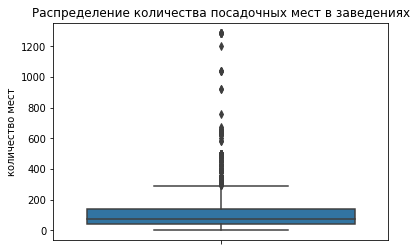

In [18]:
#построим ящик с усами по количеству посадочных мест
ax = sns.boxplot(y=data['seats'])
plt.ylabel('количество мест')
plt.title('Распределение количества посадочных мест в заведениях')
plt.show()

Согласно построенному графику "ящик с усами" можно заметить, что имеются выбросы в данных, сохраним до 650 посадочных мест в заведениях. 

In [19]:
#сохраним до 650 посадочных мест в заведениях (очистим данные от выбросов)
data_1 = data.query('seats < 650')

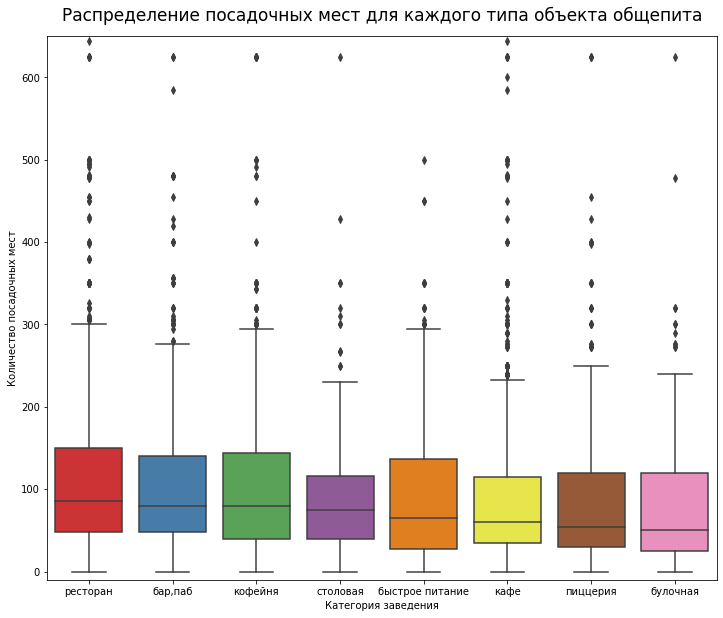

In [20]:
#отсортируем категории по медиане посадочных мест в порядке убывания
seats_count = round(data_1.groupby('category').agg({'seats' : 'median'}).sort_values(by='seats', ascending= False).reset_index(),0)

#затем создадим список категорий, отсортированных ранее
category_order = list(seats_count['category'])

#построим ящик с усами по каждой категории заведений по очищенному датафрейму data_1
fig, ax = plt.subplots(figsize = (12,10))
ax = sns.boxplot(x ='category', y ='seats', data = data_1, order = category_order, palette = 'Set1')
ax.set_ylim(-10, 650)
plt.title('Распределение посадочных мест для каждого типа объекта общепита', fontsize = 17, pad = 15)
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

In [21]:
#посчитаем медианное значение посадочных мест в местах по категориям
seats_count = round(data_1.groupby('category').agg({'seats' : 'median'}).sort_values(by='seats', ascending= False).reset_index(),0)
display(seats_count)

,category,seats
0,ресторан,86.0
1,"бар,паб",80.0
2,кофейня,80.0
3,столовая,75.0
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,54.0
7,булочная,50.0


In [22]:
#построим гистограмму
fig = px.bar(seats_count, x = 'category', y = 'seats', title = 'Медианное значение посадочных мест в местах по категориям', text='seats')
fig.update_xaxes(title_text='Категории общественного питания') # подпись для оси X
fig.update_yaxes(title_text='Медианное значение посадочных мест') # подпись для оси Y
fig.show() #выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
По количеству посадочных мест в Москве лидируют рестораны (в среднем 86 посадочных мест), в барах, пабах и кофейнях одинаковое усредненное количество посадочных мест (80 мест). Меньше всего в среднем представлено посадочных мест в булочных (50 мест) и пиццериях (54 места). Также следует обратить внимание, что количество булочных относительно других заведений общественного питания в Москве наименьшее. 

#### Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [23]:
#посчитаем соотношение cетевых и несетевых заведений
count_chain = data.groupby('chain')['name'].count().sort_values().reset_index()

#заменила значения в ячейках таблицы
display_count_chain = count_chain.replace({0: "несетевые", 1: "сетевые"})
display(display_count_chain)

,chain,name
0,сетевые,3203
1,несетевые,5199


In [24]:
#построим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=display_count_chain['chain'], # указываем значения, которые появятся на метках сегментов
                             values=display_count_chain['name'])]) # указываем данные, которые отобразятся на графике
                             
fig.update_layout(title='Соотношение сетевых и несетевых заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text = 'chain',
                                    showarrow=False)])
fig.show() # выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Наибольшее число заведений - несетевых. Их доля составляет 61,9%, тогда как доля сетевых заведений - 38,1%. 

#### Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [25]:
#построим сводную таблицу по сетевым заведениям с разбивкой по категориям
category_chain = data.pivot_table(index = 'category', columns = 'chain', values = 'name', aggfunc='count').sort_values(by=1, ascending=False)
category_chain['sum'] = category_chain[0]+category_chain[1]

#посчитаем долю сетевых и несетевых заведений от общего количества
category_chain['share_0'] = round(category_chain[0] / category_chain['sum'] * 100, 1)
category_chain['share_1'] = round(category_chain[1] / category_chain['sum'] * 100, 1)
display(category_chain)

chain,0,1,sum,share_0,share_1
category,,,,,
кафе,1597,779,2376,67.2,32.8
ресторан,1313,729,2042,64.3,35.7
кофейня,693,720,1413,49.0,51.0
пиццерия,303,330,633,47.9,52.1
быстрое питание,371,232,603,61.5,38.5
"бар,паб",596,168,764,78.0,22.0
булочная,99,157,256,38.7,61.3
столовая,227,88,315,72.1,27.9


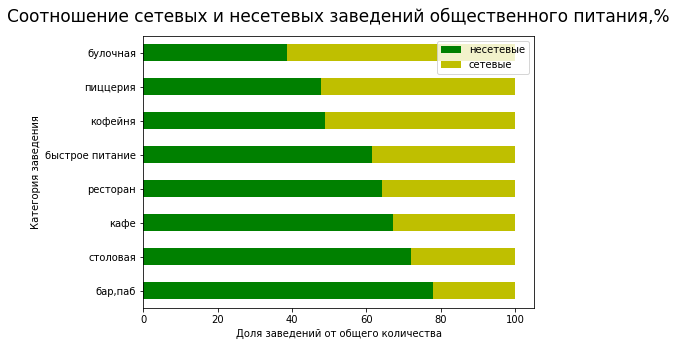

In [26]:
#построим гистограмму по соотношению сетевых и несетевых заведений
category_chain[['share_0', 'share_1']].sort_values('share_1').plot.barh(stacked=True, figsize=(7,5), color=('g', 'y'))
plt.title('Cоотношение сетевых и несетeвых заведений общественного питания,%', fontsize=17, pad=15)
plt.legend(['несетевые', 'сетевые'])
plt.xlabel('Доля заведений от общего количества')
plt.ylabel('Категория заведения')
plt.show()

In [27]:
category_chain = category_chain.reset_index()

In [28]:
#построим круговую диаграмму
#fig = go.Figure(data=[go.Pie(labels=category_chain['category'], # указываем значения, которые появятся на метках сегментов
#                             values=category_chain[1], # указываем данные, которые отобразятся на графике
#                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
#fig.update_layout(title='Сетевые объекты общественного питания по категориям', # указываем заголовок графика
#                  width=800, # указываем размеры графика
#                  height=600,
#                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
#                                    y=1.05,
#                                    text='Категории общественного питания',
#                                    showarrow=False)])
#fig.show() # выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Среди категории заведений чаще являются сетевыми следующие:  булочные (61,3%), пиццерии (52,1%), кофейни (51%). С более низкой долей (22,1%) можно встретить среди сетевых заведений - бары и пабы. 

#### Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [29]:
#сделаем срез только по сетевым заведениям и сохраним его в отдельную переменную
top_15_namee = data.query('chain == 1')

In [30]:
#построим сводную таблицу и найдем топ-15 сетей по количеству заведений
top_15_name = top_15_namee.groupby(['name']).agg({'address' : 'count'}).sort_values(by='address', ascending=False).head(15).reset_index()
top_15_name

,name,address
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [31]:
#найденные топ-15 сетей положим в список и сделаем срез по ним из исходного датафрейма
list_name = list(top_15_name['name'])
top_15 = top_15_namee.query('name in @list_name')
top_15

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,буханка,булочная,"москва, базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,базовская улица,False
23,буханка,булочная,"москва, лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,лобненская улица,False
32,додо пицца,пиццерия,"москва, коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0,коровинское шоссе,False
34,домино'с пицца,пиццерия,"москва, клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,клязьминская улица,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7973,теремок,ресторан,"москва, ореховый бульвар, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.612758,37.720272,3.7,NaN,NaN,NaN,NaN,1,0.0,ореховый бульвар,False
7974,хинкальная,ресторан,"москва, улица генерала белова, 23а",Южный административный округ,"ежедневно, 12:00–00:00",55.616224,37.719993,3.6,NaN,NaN,NaN,NaN,1,60.0,улица генерала белова,False
7979,яндекс лавка,ресторан,"москва, шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,NaN,NaN,NaN,NaN,1,75.0,шипиловский проезд,False
7980,яндекс лавка,ресторан,"москва, улица маршала захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,NaN,NaN,NaN,NaN,1,200.0,улица маршала захарова,False


In [32]:
#выведем по топ-15 cетевым заведениям их категории, к которым они относятся
top_15_names = top_15.groupby(['name', 'category']).agg({'address' : 'count'}).sort_values(by='address', ascending=False).reset_index()
top_15_names

,name,category,address
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


In [33]:
#построим гистограмму
fig = px.bar(top_15_names, x = 'name', y = 'address', color='category', title = 'Tоп-15 популярных сетей Москвы')
fig.update_xaxes(title_text='Названия сетей') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений в регионе') # подпись для оси Y
fig.update_xaxes(tickangle=45)
fig.update_layout(width=1000, height=800) #задаем размеры графика
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}) #задаем сортировку по убыванию
fig.show() #выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Среди топ-15 популярных сетей в Москве лидирующее положение занимает сеть "Шоколадница" (120 заведений). Затем примерно с одинаковым количеством заведений представлены пиццерии "Домино'с Пицца" и "Додо Пицца" (76 и 74 заведения соответственно). Самую низкую позицию в топ - 15 сетей Москвы занимает "Му-му" с общим количеством заведений - 27.<br>
В основном, среди топ-15 популярных сетей в Москве преобладают кофейни. Это и есть признак, который их объединяет.

#### Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [34]:
district_category = data.pivot_table(index=['district'], values = ['name'], columns='category', aggfunc = ['size'])

district_category['total'] = district_category.sum(axis=1)
district_category['percent_from_total'] = round(district_category['total']/ district_category['total'].sum()*100,2)
display(district_category)

size                                \
category                                бар,паб булочная быстрое питание кафе   
district                                                                        
Восточный административный округ             53       25              71  272   
Западный административный округ              50       37              62  238   
Северный административный округ              68       39              58  234   
Северо-Восточный административный округ      62       28              82  269   
Северо-Западный административный округ       23       12              30  115   
Центральный административный округ          364       50              87  464   
Юго-Восточный административный округ         38       13              67  282   
Юго-Западный административный округ          38       27              61  238   
Южный административный округ                 68       25              85  264   

                                                                            \
category                                кофейня пиццерия ресторан столовая   
district                                                                     
Восточный административный округ            105       72      160       40   
Западный административный округ             150       71      218       24   
Северный административный округ             193       77      188       41   
Северо-Восточный административный округ     159       68      182       40   
Северо-Западный административный округ       62       40      109       18   
Центральный административный округ          428      113      670       66   
Юго-Восточный административный округ         89       55      145       25   
Юго-Западный административный округ          96       64      168       17   
Южный административный округ                131       73      202       44   

                                        total percent_from_total  
category                                                          
district                                                          
Восточный административный округ          798               9.50  
Западный административный округ           850              10.12  
Северный административный округ           898              10.69  
Северо-Восточный административный округ   890              10.59  
Северо-Западный административный округ    409               4.87  
Центральный административный округ       2242              26.68  
Юго-Восточный административный округ      714               8.50  
Юго-Западный административный округ       709               8.44  
Южный административный округ              892              10.62

In [35]:
#cгруппируем данные по административным районам Москвы
count_district = data.groupby(['district']).agg({'name' : 'count'}).sort_values(by='name', ascending=False).reset_index()
display(count_district)

,district,name
0,Центральный административный округ,2242
1,Северный административный округ,898
2,Южный административный округ,892
3,Северо-Восточный административный округ,890
4,Западный административный округ,850
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [36]:
#cгруппируем данные по административным районам и категориям заведений Москвы
count_district = data.groupby(['district', 'category']).agg({'name' : 'count'}).reset_index()
display(count_district)

,district,category,name
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


In [37]:
#построим гистограмму
fig = px.bar(count_district, x = 'district', y = 'name', color='category', title = 'Административные районы Москвы по категориям')
fig.update_xaxes(title_text='Административные районы Москвы') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений') # подпись для оси Y
fig.update_xaxes(tickangle=45)
fig.update_layout(width=1000, height=800)
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}) #сортировка по убыванию
fig.show() #выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
В датасете присутствует 9 административных районов Москвы. По количеству заведений лидирующие позиции занимает Центральный административный округ (общее количество 2242 заведения). Затем Северный административный округ (900 заведений) и Южный административный округ (892 заведения). Наименьшее количество заведений представлено в Северо-Западном административном округе (409 заведений). В центральном административном округе преобладают рестораны (670 заведений), затем кафе (464 заведения). Наименьшее количество столовых (17 заведений) представлено в Юго-Западном административном округе. <br>
Также стоит обратить внимание, что не во всех округах представлено одинаковое распределение категорий. Так, в Центральном административном округе больше всего баров и пабов, по сравнению с другими районами. В Северо-Западном административном округе наименьшее количество булочных, относительно других районов. 

#### Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [38]:
#сгруппируем датафрейм и посчитаем средние рейтинги по категориям заведений 
avg_rating = data.groupby('category').agg({'rating' : 'mean'}).sort_values(by='rating', ascending = False).reset_index()
display(avg_rating)

,category,rating
0,"бар,паб",4.387696
1,пиццерия,4.301264
2,ресторан,4.290402
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.124285
7,быстрое питание,4.050249


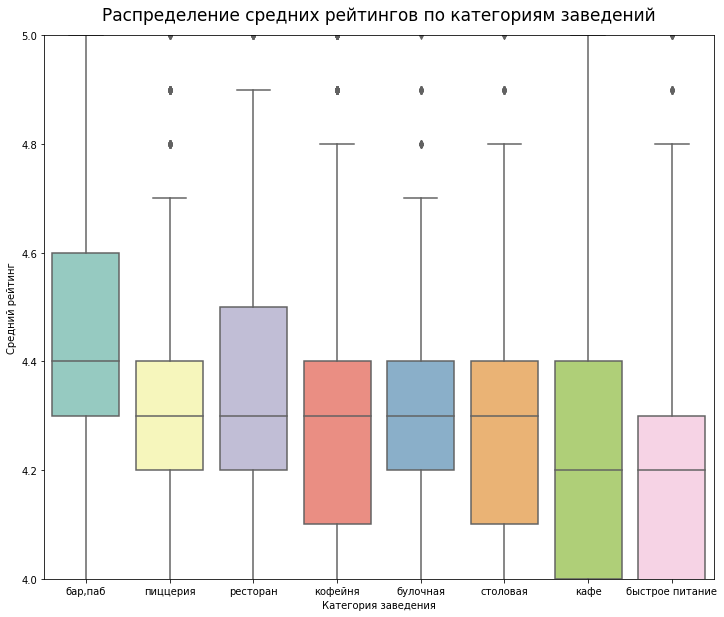

In [39]:
#отсортируем категории заведений по среднему рейтингу в порядке убывания
avg_rating = data.groupby('category').agg({'rating' : 'mean'}).sort_values(by='rating', ascending = False).reset_index()

#затем создадим список категорий, отсортированных ранее
avg_rating_order = list(avg_rating['category'])

#построим ящик с усами по каждой категории заведений со средними рейтингами
fig, ax = plt.subplots(figsize=(12,10))
ax = sns.boxplot(x='category', y='rating', data = data, order = avg_rating_order, palette = 'Set3')
ax.set_ylim(4, 5)
plt.title('Распределение средних рейтингов по категориям заведений', fontsize=17, pad=15)
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.show()

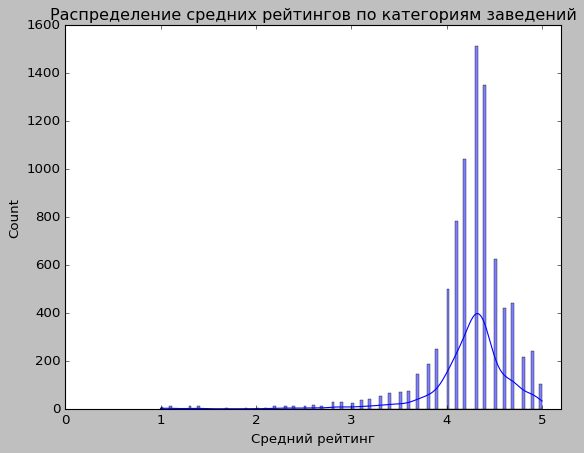

In [40]:
# назначаем классический стиль для графика с помощью matplotlib
plt.style.use('classic')
# строим гистограмму для столбца rating, добавив график кривой KDE
sns.histplot(x='rating', data=data, kde=True)
# ограничиваем ось X для наглядности
plt.xlim(0, 5.2)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Cредний рейтинг')
# отображаем график на экране
plt.show()

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Распределение средних рейтингов по всем категориям заведений лежит в диапазоне от 4,05 до 4,39. Самый высокий средний рейтинг (4,39) занимает категория "бар,паб", затем пиццерии с рейтингом 4,3. Самый низкий устредненный рейтинг имеют заведения быстрого питания (4,05). В разных типах общественного питания усреднённые рейтинги отличаются не сильно.<br>
Наиболее частовстречающимся рейтингом по распределению является усредненный рейтинг 4,3. 

#### Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле `admin_level_geomap.geojson` (скачать файл для локальной работы).

In [41]:
#для каждого округа посчитаем средний рейтинг заведений общепита, которые находятся на их территориях:
rating_data = round(data.groupby('district', as_index=False)['rating'].agg('mean'),4)
rating_data.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.3775
2,Северный административный округ,4.2410
4,Северо-Западный административный округ,4.2088
8,Южный административный округ,4.1844
1,Западный административный округ,4.1816
0,Восточный административный округ,4.1742
7,Юго-Западный административный округ,4.1729
3,Северо-Восточный административный округ,4.1480
6,Юго-Восточный административный округ,4.1011


Данные об округах Москвы из датасета сохранены в файл admin_level_geomap.geojson. Файл содержит границы областей в виде полигонов — многоугольников, которые задаются вершинами в виде широты и долготы.<br>
Построим фоновую картограмму (хороплет)

In [42]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Хороплет позволяет сразу охватить все различия. Каждый заранее заданный регион окрашивается в соответствии со значением какого-либо показателя. Чтобы корректно отражать показатели на хороплете, важно использовать нормированные значения. Средние и медианные значения в каком-либо диапазоне уже являются нормированными. Например, средние рейтинги заведений для каждого региона, которые могут быть дробными числами от 1 до 5, уже можно считать нормированными и визуализировать.<br>
Хороплет показывает, как распределены средние рейтинги заведений общественного питания в разных административных округах Москвы. По хороплету можно увидеть, что самый высокий усредненный рейтинг заведений общественного питания находится в Центральном административном округе (4,4). 

#### Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.

Отметим все заведения общественного питания на карте с помощью кластеров.

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# считываем данные из файла
df = pd.read_csv('/datasets/moscow_malls_info.csv')

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/glyph-neue/2x/restaurant-building.png'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Кластеры автоматически перегруппировываются: при достаточном приближении из кластеров начнут «выпадать» отдельные маркеры с заведениями общественного питания. Всплывающие окна и подсказки для них реализованы точно так же, как и для отдельных маркеров.<br>
При построении кластеров были использованы собственные иконки, с визуальным отображением заведений общественного питания.

#### Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [44]:
#построим своднуб таблицу и найдем топ-15 улиц по количеству заведений
top_15_street = data.groupby(['street']).agg({'name' : 'count'}).sort_values(by='name', ascending=False).head(15).reset_index()
top_15_street

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [45]:
#найденные топ-15 улиц положим в список и сделаем срез по ним из исходного датафрейма
list_streets = list(top_15_street['street'])
top_15_streets = data.query('street in @list_streets')
top_15_streets

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,дмитровское шоссе,False
12,заправка,кафе,"москва, мкад, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,мкад,False
17,чайхана беш-бармак,ресторан,"москва, ленинградское шоссе, 71б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,ленинградское шоссе,True
26,пикочино,пиццерия,"москва, дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,дмитровское шоссе,False
28,mafe,кафе,"москва, мкад, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,мкад,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False
8396,пекинский двор,ресторан,"москва, ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,ленинский проспект,False
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True


In [46]:
#выведем по топ-15 улицам категории заведений, которые на них расположены
top_15_streetss = top_15_streets.groupby(['street', 'category']).agg({'district' : 'count'}).sort_values(by='district', ascending=False).reset_index()
top_15_streetss

,street,category,district
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
106,люблинская улица,пиццерия,1
107,проспект вернадского,булочная,1
108,мкад,столовая,1
109,кутузовский проспект,булочная,1


In [47]:
#построим гистограмму
fig = px.bar(top_15_streetss, x = 'street', y = 'district', color='category', title = 'Tоп-15 улиц по количеству заведений с разбивкой по категориям')
fig.update_xaxes(title_text='Названия улиц') # подпись для оси X
fig.update_yaxes(title_text='Количество заведений на улице') # подпись для оси Y
fig.update_xaxes(tickangle=45)
fig.update_layout(width=1000, height=800) #задаем размеры графика
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'}) #задаем сортировку по убыванию
fig.show() #выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
В топ-15 улиц по количеству заведений лидирующие позиции занимает улица "Проспект Мира" (184 заведения). Затем "Профсоюзная улица" (122 заведения). В целом, это одни из самых широких и больших по протяженности улиц Москвы, на которых расположено большое количество офисов.<br>
Стоит обратить внимание, что не на всех улицах присутствует одинаковое распределение категорий. Есть улицы с выбивающимся распределением. Например, на улице "Проспект Мира" представлено наибольшее число кафе и ресторанов. На улицах Каширское шоссе, Варшавское шоссе, МКАД, Люблинская улица и Улица Миклухо-Маклая совершенно отсутствуют булочные, а на других улицах они есть. На МКАД присутствует наименьшее число ресторанов, что является логичным. На Пятницкой улице представлено наименьшее число кафе. 

#### Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [48]:
#сделаем сводную таблицу и посчитаем количество улиц с одним объектом общепита
count_street = data.groupby('street').agg({'name':'count'}).reset_index()
one_street = count_street.query('name == 1')
one_street

,street,name
0,1-й автозаводский проезд,1
1,1-й балтийский переулок,1
2,1-й варшавский проезд,1
3,1-й вешняковский проезд,1
5,1-й голутвинский переулок,1
...,...,...
1425,электрический переулок,1
1432,юго-западный административный округ,1
1437,якиманский переулок,1
1438,яковоапостольский переулок,1


Сделаем срез по улицам, на которых расположен только один объект общественного питания.

In [49]:
#найденное количество улиц положим в список и сделаем срез по ним из исходного датафрейма
list_streets = list(one_street['street'])
one_str = data.query('street in @list_streets')
one_str

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица бусиновская горка,False
21,7/12,кафе,"москва, прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,прибрежный проезд,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,угличская улица,False
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,мираж,ресторан,"москва, улица шкулёва, 2а",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица шкулёва,False
8294,wtfcoffee,кофейня,"москва, улица артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица артюхиной,False
8317,беседка,кафе,"москва, кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,кузьминская улица,False
8379,лагман хаус,кафе,"москва, новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,новороссийская улица,False


In [50]:
#посчитаем по каждому району количество улиц, на которых расположен только один общепит
one_str_district = one_str.groupby('district').agg({'category' : 'count'}).sort_values(by='category', ascending=False).reset_index()
one_str_district

,district,category
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,51
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [51]:
#построим гистограмму
fig = px.bar(one_str_district.sort_values(by='category', ascending=True), x = 'category', y = 'district', title = 'Количество улиц по административным районам Москвы, на которых расположен один объект общепита ', text='category')
fig.update_xaxes(title_text='Количество улиц, на которых расположен только один общепит') # подпись для оси X
fig.update_yaxes(title_text='Административный район Москвы') # подпись для оси Y
fig.show() #выводим график

Посмотрим какая категория заведений преобладает по расположению одного общепита на улице. 

In [52]:
#посчитаем по каждой категории количество улиц, на которых расположен только один общепит
one_str_category = one_str.groupby('category').agg({'street' : 'count'}).sort_values(by='street', ascending=False).reset_index()
one_str_category

,category,street
0,кафе,159
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


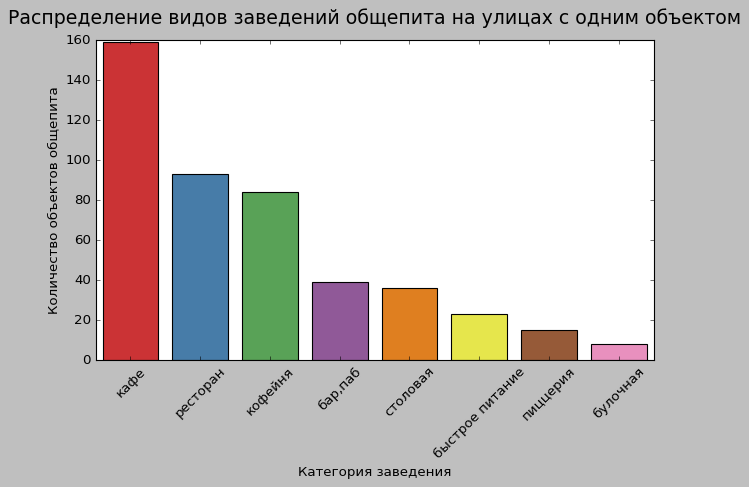

In [53]:
#построим гистограмму
fig, ax = plt.subplots(figsize=(9,5))
sns.barplot(x='category', y='street', data=one_str_category, palette='Set1')
plt.xticks(rotation=45)
plt.title('Распределение видов заведений общепита на улицах с одним объектом', fontsize=17, pad=15)
plt.xlabel('Категория заведения') # подпись для оси X
plt.ylabel('Количество объектов общепита') # подпись для оси Y
plt.show() #выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Всего найдено 458 улиц, на которых находится только один объект общепита по всем районам Москвы. В центральном административном округе находится наибольшее количество улиц, с одним объектом общепита (145 улиц), затем Северо-Восточный административный округ (55 улиц). В разрезе категории заведений, в топе кафе и рестораны. Именно кафе и рестораны по большей части расположены по одному заведению на улице. 
    

#### Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [54]:
#посчитаем по каждому району медианную стоимость заказа в рублях
middle_avg_bill_median = data.groupby('district').agg({'middle_avg_bill' : 'median'}).sort_values(by='middle_avg_bill', ascending=False).reset_index()
middle_avg_bill_median

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [55]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Mедианная стоимость заказа в рублях',
).add_to(m)

# выводим карту
m

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Самая высокая медианная стоимость заказа в рублях представлена в заведениях общественного питания, расположенных в Центральном административном округе (1000 руб) и в Западном административном округе (1000 руб). Имеется следующая зависимость, чем отдаленнее от центра находится заведение, тем ниже медианная стоимость цен в этих заведениях. И соответственно, наоборот, чем ближе к центру находится заведение, тем выше стоимость заказа. 

#### Проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

Исследуем часы работы заведений и их зависимость от расположения и категории заведения. 

In [56]:
#построим сводную таблицу с разбивкой заведений по часам работы, районам и категориям 
data_hours = data.pivot_table(index=['is_24/7', 'district'], values = ['name'], columns='category', aggfunc = ['size'])
data_hours['total'] = data_hours.sum(axis=1)
data_hours['percent_from_total'] = round(data_hours['total']/ data_hours['total'].sum()*100,2)
data_hours

size           \
category                                        бар,паб булочная   
is_24/7 district                                                   
False   Восточный административный округ           50.0     17.0   
        Западный административный округ            43.0     36.0   
        Северный административный округ            61.0     32.0   
        Северо-Восточный административный округ    52.0     24.0   
        Северо-Западный административный округ     23.0      9.0   
        Центральный административный округ        335.0     49.0   
        Юго-Восточный административный округ       32.0     11.0   
        Юго-Западный административный округ        37.0     25.0   
        Южный административный округ               61.0     22.0   
True    Восточный административный округ            1.0      6.0   
        Западный административный округ             5.0      NaN   
        Северный административный округ             4.0      5.0   
        Северо-Восточный административный округ     4.0      4.0   
        Северо-Западный административный округ      NaN      3.0   
        Центральный административный округ         29.0      1.0   
        Юго-Восточный административный округ        5.0      1.0   
        Юго-Западный административный округ         NaN      1.0   
        Южный административный округ                4.0      3.0   

                                                                        \
category                                        быстрое питание   кафе   
is_24/7 district                                                         
False   Восточный административный округ                   45.0  185.0   
        Западный административный округ                    42.0  166.0   
        Северный административный округ                    40.0  177.0   
        Северо-Восточный административный округ            62.0  198.0   
        Северо-Западный административный округ             20.0   74.0   
        Центральный административный округ                 71.0  414.0   
        Юго-Восточный административный округ               46.0  170.0   
        Юго-Западный административный округ                37.0  162.0   
        Южный административный округ                       57.0  189.0   
True    Восточный административный округ                   21.0   33.0   
        Западный административный округ                    18.0   25.0   
        Северный административный округ                    14.0   28.0   
        Северо-Восточный административный округ            17.0   31.0   
        Северо-Западный административный округ              7.0   12.0   
        Центральный административный округ                 14.0   30.0   
        Юго-Восточный административный округ               15.0   48.0   
        Юго-Западный административный округ                20.0   34.0   
        Южный административный округ                       24.0   26.0   

                                                                           \
category                                        кофейня пиццерия ресторан   
is_24/7 district                                                            
False   Восточный административный округ           97.0     63.0    132.0   
        Западный административный округ           139.0     69.0    195.0   
        Северный административный округ           186.0     74.0    167.0   
        Северо-Восточный административный округ   154.0     63.0    163.0   
        Северо-Западный административный округ     60.0     39.0     84.0   
        Центральный административный округ        400.0    110.0    639.0   
        Юго-Восточный административный округ       87.0     46.0    122.0   
        Юго-Западный административный округ        87.0     64.0    149.0   
        Южный административный округ              129.0     69.0    182.0   
True    Восточный административный округ            5.0      8.0     21.0   
        Западный административный округ             9.0      2.0  

По таблице такого вида (ячейка с кодом выше - 56) я не смогла построить график, подскажи, пожалуйста, как из такой таблицы можно построить график. 

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Исследование по часам работы заведений и их зависимость от расположения и категории заведения показало, что у нас 730 заведений (9% заведений от общего числа), работающих по графику "ежедневно, круглосуточно". При этом, наибольшую долю из них составляют заведения, расположенные в Центральном административном округе(131 заведение). В Северо-Западном административном округе находится наименьшее количество заведений (43 заведения), работающих в режиме "ежедневно, круглосуточно". <br>

Заведений, работающих по другим графикам всего 7140 (91% от общего числа заведений). Причем также их наибольшее число расположено в Центральном административном округе, и наименьшее в Северо-Западном административном округе. 

Исследуем особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

In [57]:
#отсортируем исходный датафрейм по заведениям с плохим рейтингом - от 1 до 3 включительно
data_ratings = data[(data['rating'] >= 1) & (data['rating'] <= 3)]
data_ratings

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
47,кафе,кафе,"москва, улица маршала федоренко, 7",Северный административный округ,"ежедневно, 11:00–00:00",55.880306,37.489760,2.8,NaN,NaN,NaN,NaN,0,35.0,улица маршала федоренко,False
49,2u-ту-ю,пиццерия,"москва, ижорская улица, 8а",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN,ижорская улица,True
56,рыба из тандыра,быстрое питание,"москва, коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN,коровинское шоссе,NaN
132,пекарня-шаурма,быстрое питание,"москва, алтуфьевское шоссе, 84",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895949,37.588100,2.0,NaN,NaN,NaN,NaN,0,4.0,алтуфьевское шоссе,True
150,правда,"бар,паб","москва, дмитровское шоссе, 124а",Северо-Восточный административный округ,"ежедневно, 08:00–23:00",55.924367,37.549657,1.4,NaN,NaN,NaN,NaN,0,NaN,дмитровское шоссе,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8242,чайхона шафран,ресторан,"москва, южнопортовая улица, 5, стр. 16",Юго-Восточный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–02:00; вс 11:00...",55.706707,37.689065,2.8,NaN,NaN,NaN,NaN,0,42.0,южнопортовая улица,False
8314,фрегат,кафе,"москва, 8-я улица текстильщиков, 11",Юго-Восточный административный округ,пн-пт 09:00–17:00,55.703459,37.743814,1.3,NaN,NaN,NaN,NaN,0,96.0,8-я улица текстильщиков,False
8382,выхинский дворик,кафе,"москва, улица хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 11:00–01:00",55.716368,37.813366,3.0,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,32.0,улица хлобыстова,False
8391,кафе кенч,кафе,"москва, 1-я новокузьминская улица, 3",Юго-Восточный административный округ,"ежедневно, 11:00–00:00",55.716771,37.785316,2.8,NaN,NaN,NaN,NaN,0,45.0,1-я новокузьминская улица,False


In [58]:
#построим своодную таблицу по категориям заведений, медианным значениям рейтингов и среднего чека
data_ratingss = data_ratings.pivot_table(index=['category'], values=['middle_avg_bill', 'rating'], aggfunc='median').sort_values(by='rating').reset_index()
data_ratingss

,category,middle_avg_bill,rating
0,"бар,паб",NaN,1.40
1,булочная,325.0,1.75
2,ресторан,NaN,2.40
3,кофейня,NaN,2.45
4,быстрое питание,325.0,2.50
5,кафе,750.0,2.50
6,столовая,237.5,2.50
7,пиццерия,900.0,2.70


In [59]:
#построим гистограмму
fig = px.bar(data_ratingss, x = 'category', y = 'rating', color='middle_avg_bill', title = 'Средние чеки в заведениях с плохими рейтингами по категориям')
fig.update_xaxes(title_text='Категория заведения') # подпись для оси X
fig.update_yaxes(title_text='Медианный рейтинг заведения') # подпись для оси Y
fig.update_xaxes(tickangle=45)
fig.update_layout(width=1000, height=800) #задаем размеры графика
fig.show() #выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Исследование заведений с плохими рейтингами (взяты рейтинги от 1 до 3 включительно), показало, что в барах и пабах самые плохие медианные рейтинги - 1,4, затем идут булочные с рейтингом - 1,75. Выявлена интересная особенность, при медианном рейтинге заведения 2,5 получилось 3 разных средних чека (в столовой - 238 руб, в заведениях быстрого питания - 325 руб, в кафе - 750 руб.). 

**ОБЩИE ВЫВОДЫ**<br>

Был проведен анализ рынка заведений общественного питания Москвы, по которому можно сделать следующие выводы:
1. По количеству заведений в Москве лидируют кафе (28,3%), затем рестораны (24,3%) и кофейни (16,8%). Меньше всего представлено таких заведений, как булочные (3,05%) и столовые (3,75%). <br><br>
2. По количеству посадочных мест в Москве лидируют рестораны (в среднем 86 посадочных мест), в барах, пабах и кофейнях одинаковое усредненное количество посадочных мест (80 мест). Меньше всего в среднем представлено посадочных мест в булочных (50 мест) и пиццериях (54 места). Также следует обратить внимание, что количество булочных относительно других заведений общественного питания в Москве наименьшее. <br><br>
3. По количеству сетевых/несетевых заведений. Наибольшее число заведений - несетевых. Их доля составляет 61,9%, тогда как доля сетевых заведений - 38,1%.<br><br>
4. Среди категории заведений чаще являются сетевыми следующие:  булочные (61,3%), пиццерии (52,1%), кофейни (51%). С более низкой долей (22,1%) можно встретить среди сетевых заведений - бары и пабы. <br><br>
5. Среди топ-15 популярных сетей в Москве лидирующее положение занимает сеть "Шоколадница" (120 заведений). Затем примерно с одинаковым количеством заведений представлены пиццерии "Домино'с Пицца" и "Додо Пицца" (76 и 74 заведения соответственно). Самую низкую позицию в топ - 15 сетей Москвы занимает "Му-му" с общим количеством заведений - 27.<br>
В основном, среди топ-15 популярных сетей в Москве преобладают кофейни. Это и есть признак, который их объединяет.<br><br>
6. В датасете присутствует 9 административных районов Москвы. По количеству заведений лидирующие позиции занимает Центральный административный округ (общее количество 2242 заведения). Затем Северный административный округ (900 заведений) и Южный административный округ (892 заведения). Наименьшее количество заведений представлено в Северо-Западном административном округе (409 заведений). В центральном административном округе преобладают рестораны (670 заведений), затем кафе (464 заведения). Наименьшее количество столовых (17 заведений) представлено в Юго-Западном административном округе. <br>
Также стоит обратить внимание, что не во всех округах представлено одинаковое распределение категорий. Так, в Центральном административном округе больше всего баров и пабов, по сравнению с другими районами. В Северо-Западном административном округе наименьшее количество булочных, относительно других районов.<br><br>
7. Распределение средних рейтингов по всем категориям заведений лежит в диапазоне от 4,05 до 4,39. Самый высокий средний рейтинг (4,39) занимает категория "бар,паб", затем пиццерии с рейтингом 4,3. Самый низкий устредненный рейтинг имеют заведения быстрого питания (4,05). В разных типах общественного питания усреднённые рейтинги отличаются не сильно.<br>
Наиболее частовстречающимся рейтингом по распределению является усредненный рейтинг 4,3. <br><br>
8. Построенный хороплет показывает, как распределены средние рейтинги заведений общественного питания в разных административных округах Москвы. По хороплету можно увидеть, что самый высокий усредненный рейтинг заведений общественного питания находится в Центральном административном округе (4,4). <br><br>
9. В топ-15 улиц по количеству заведений лидирующие позиции занимает улица "Проспект Мира" (184 заведения). Затем "Профсоюзная улица" (122 заведения). В целом, это одни из самых широких и больших по протяженности улиц Москвы, на которых расположено большое количество офисов.<br>
Стоит обратить внимание, что не на всех улицах присутствует одинаковое распределение категорий. Есть улицы с выбивающимся распределением. Например, на улице "Проспект Мира" представлено наибольшее число кафе и ресторанов. На улицах Каширское шоссе, Варшавское шоссе, МКАД, Люблинская улица и Улица Миклухо-Маклая совершенно отсутствуют булочные, а на других улицах они есть. На МКАД присутствует наименьшее число ресторанов, что является логичным. На Пятницкой улице представлено наименьшее число кафе.  <br><br>
10. Всего найдено 458 улиц, на которых находится только один объект общепита по всем районам Москвы. В центральном административном округе находится наибольшее количество улиц, с одним объектом общепита (145 улиц), затем Северо-Восточный административный округ (55 улиц). В разрезе категории заведений, в топе кафе и рестораны. Именно кафе и рестораны по большей части расположены по одному заведению на улице. <br><br>
11. Самая высокая медианная стоимость заказа в рублях представлена в заведениях общественного питания, расположенных в Центральном административном округе (1000 руб) и в Западном административном округе (1000 руб). Имеется следующая зависимость, чем отдаленнее от центра находится заведение, тем ниже медианная стоимость цен в этих заведениях. И соответственно, наоборот, чем ближе к центру находится заведение, тем выше стоимость заказа. <br><br>
12. Исследование по часам работы заведений и их зависимость от расположения и категории заведения показало, что у нас 730 заведений (9% заведений от общего числа), работающих по графику "ежедневно, круглосуточно". При этом, наибольшую долю из них составляют заведения, расположенные в Центральном административном округе(131 заведение). В Северо-Западном административном округе находится наименьшее количество заведений (43 заведения), работающих в режиме "ежедневно, круглосуточно". <br>
Заведений, работающих по другим графикам всего 7140 (91% от общего числа заведений). Причем также их наибольшее число расположено в Центральном административном округе, и наименьшее в Северо-Западном административном округе. <br><br>
13. Исследование заведений с плохими рейтингами (взяты рейтинги от 1 до 3 включительно), показало, что в барах и пабах самые плохие медианные рейтинги - 1,4, затем идут булочные с рейтингом - 1,75. Выявлена интересная особенность, при медианном рейтинге заведения 2,5 получилось 3 разных средних чека (в столовой - 238 руб, в заведениях быстрого питания - 325 руб, в кафе - 750 руб.). 



### Детализируем исследование: открытие кофейни

Потенциальные заказчики данного исследования приняли решение открыть кофейню, сформулируем рекомендации. Допускается, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно.

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [60]:
#посчитаем количество кофеен, сделав срез из исходного датафрейма
data_2 = data.query('category=="кофейня"')
data_2

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный,False
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе,False
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,волгоградский проспект,False
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,грайвороновская улица,False
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,новохохловская улица,False


In [61]:
#посчитаем по каждому району количество кофеен
data_2_district = data_2.groupby('district').agg({'category' : 'count'}).sort_values(by='category', ascending=False).reset_index()
data_2_district['percent_from_total'] = round(data_2_district['category']/ data_2_district['category'].sum()*100,2)
data_2_district

,district,category,percent_from_total
0,Центральный административный округ,428,30.29
1,Северный административный округ,193,13.66
2,Северо-Восточный административный округ,159,11.25
3,Западный административный округ,150,10.62
4,Южный административный округ,131,9.27
5,Восточный административный округ,105,7.43
6,Юго-Западный административный округ,96,6.79
7,Юго-Восточный административный округ,89,6.30
8,Северо-Западный административный округ,62,4.39


In [62]:
#построим гистограмму
fig = px.bar(data_2_district.sort_values(by='category', ascending=True), x = 'category', y = 'district', title = 'Количество кофеен по районам', text='category')
fig.update_xaxes(title_text='Количество') # подпись для оси X
fig.update_yaxes(title_text='Административные районы') # подпись для оси Y
fig.show() #выводим график

In [63]:
#построим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=data_2_district['district'], # указываем значения, которые появятся на метках сегментов
                             values=data_2_district['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Соотношение кофеен по районам', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Административные районы',
                                    showarrow=False)])
fig.show() # выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Всего в датасете 1413 кофеен. Из них большая часть (30%) расположена в Центральном административном округе, 13% от общего числа кофеен расположено в Северном административном округе и 11% в Северо-Восточном административном округе. Наименьшая доля кофеен 4% представлена в Северо-Западном административном округе. 

#### Есть ли круглосуточные кофейни?

In [64]:
#посчитаем соотношение круглосуточных и некруглосуточных заведений
data_2_hours = data_2.groupby('is_24/7')['name'].count().sort_values().reset_index()

#заменила значения в ячейках таблицы
display_data_2_hour = data_2_hours.replace({True: "круглосуточный", False: "некруглосуточный"})
display(display_data_2_hour)


,is_24/7,name
0,круглосуточный,59
1,некруглосуточный,1339


In [65]:
#построим круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=display_data_2_hour['is_24/7'], # указываем значения, которые появятся на метках сегментов
                             values=display_data_2_hour['name'])]) # указываем данные, которые отобразятся на графике
                             
fig.update_layout(title='Соотношение круглосуточных и не круглосуточных кофеен', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Режим работы заведений',
                                    showarrow=False)])
fig.show() # выводим график

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
Исследование показало, что кофейни, работающие круглосуточно cуществуют, их количество составило - 59, что составляет 4,2% от общей доли кофеен. Наибольшая доля - 95,8% - это кофейни не работающие круглосуточно. 

#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [66]:
#сгруппируем датафрейм и посчитаем средние рейтинги по районам в кофейнях 
avg_rating_2 = data_2.groupby('district').agg({'rating' : 'mean'}).sort_values(by='rating', ascending = False).reset_index()
display(avg_rating_2)

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


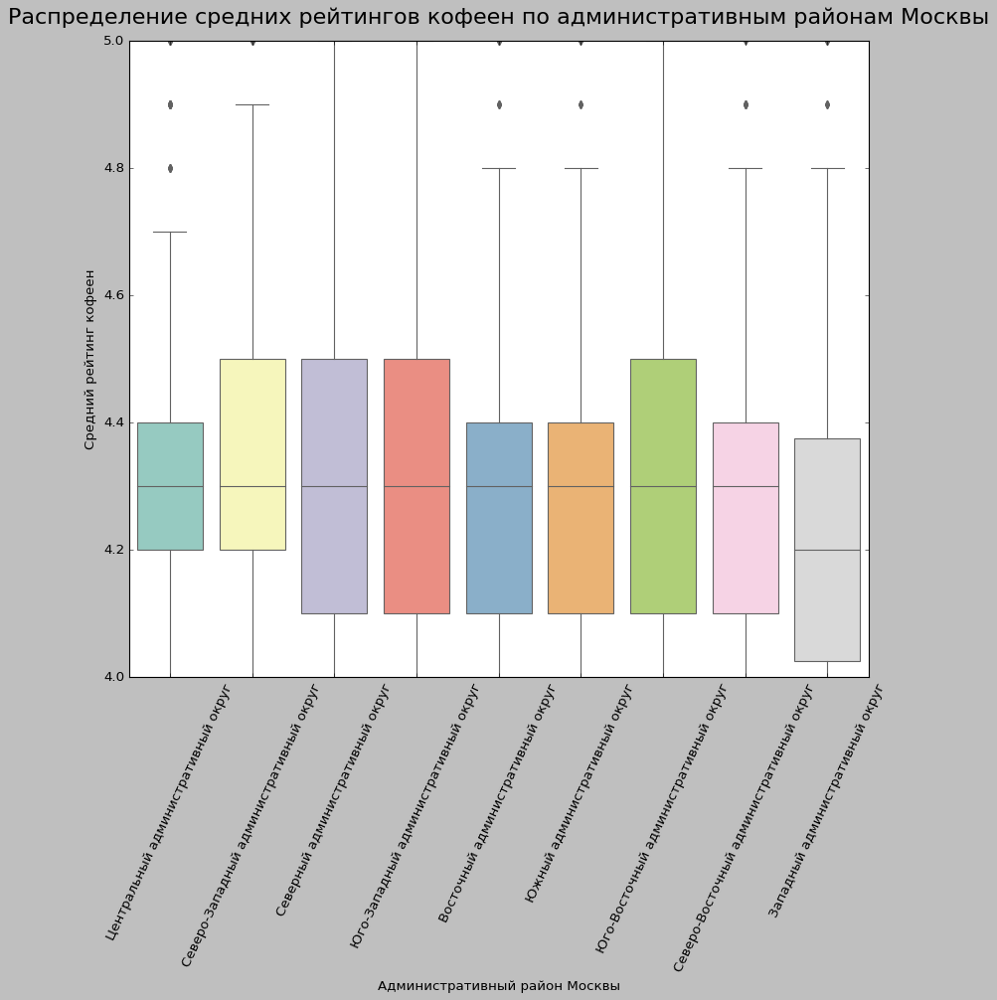

In [67]:
#отсортируем категории по медиане посадочных мест в порядке убывания
avg_rating_2 = data_2.groupby('district').agg({'rating' : 'mean'}).sort_values(by='rating', ascending = False).reset_index()

#затем создадим список категорий, отсортированных ранее
avg_rating_order = list(avg_rating_2['district'])

#построим ящик с усами по каждой категории заведений со средними рейтингами
fig, ax = plt.subplots(figsize=(12,10))
ax = sns.boxplot(x='district', y='rating', data = data_2, order = avg_rating_order, palette = 'Set3')
ax.set_ylim(4, 5)
plt.title('Распределение средних рейтингов кофеен по административным районам Москвы', fontsize=20, pad=15)
plt.xlabel('Административный район Москвы')
plt.ylabel('Средний рейтинг кофеен')
plt.xticks(rotation=65)
plt.show()



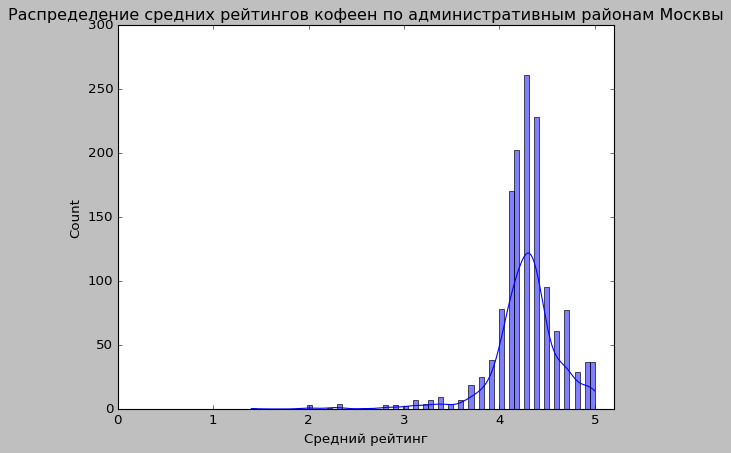

In [68]:
# назначаем классический стиль для графика с помощью matplotlib
plt.style.use('classic')
# строим гистограмму для столбца rating, добавив график кривой KDE
sns.histplot(x='rating', data=data_2, kde=True)
# ограничиваем ось X для наглядности
plt.xlim(0, 5.2)
# указываем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение средних рейтингов кофеен по административным районам Москвы')
plt.xlabel('Cредний рейтинг')
# отображаем график на экране
plt.show()

Отметим все кофейни из датасета на карте с помощью кластеров.

In [69]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# считываем данные из файла
df = pd.read_csv('/datasets/moscow_malls_info.csv')

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/glyph-neue/2x/restaurant-building.png'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров к каждой строке датафрейма
data_2.apply(create_clusters, axis=1)

# выводим карту
m

Построим фоновую картограмму (хороплет) с полученными средними рейтингами кофеен для каждого района.

In [70]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_rating_2,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
У кофеен средний рейтинг определяется в диапазоне от 4,20 до 4,34, в зависимости от расположения, относительно административных округов Москвы. Так, в Центральном административном округе рейтинг самый высокий - 4,34. А в Западном административном округе самый низкий - 4,2. В Северо-Западном административном округе средний рейтинг кофеен составляет 4,33. На столбчатом графике можно заметить что распределение в данном случае нормальное. 	

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [71]:
#посчитаем по каждому району медианную стоимость заказа в рублях
middle_coffee_cup_madian = data_2.groupby('district').agg({'middle_coffee_cup' : 'median'}).sort_values(by='middle_coffee_cup', ascending=False).reset_index()
middle_coffee_cup_madian

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


In [72]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_coffee_cup_madian,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Mедианная стоимость заказа в рублях',
).add_to(m)

# выводим карту
m

**Выводы:**

<p></p>

<div style="border:solid green 2px; padding: 20px">
При открытии кофейни стоит ориентироваться на стоимость чашки капучино в диапазоне от 135-198 рублей, в зависимости от расположения кофейни. Так, если открывать кафе в Центральном округе Москвы, необходимо учитывать среднюю стоимость 190 руб, то есть цена в новом кафе может быть незначительно выше или ниже, в зависимости от выбранной стратегии. Для начала обязательноо нужно опираться на конкурентную стоимость чашки капучино по району.<br>

**Рекомендации**<br>

По результатам исследования можно сделать следующие рекомендации для открытия новой кофейни:
1. Так как всего кофеен по Москве 1413, конкуренция большая, следует открывать кофейню в Центральном административном округе, так как именно там расположена наибольшая доля кофеен.
2. У кофеен средний рейтинг определяется в диапазоне от 4,20 до 4,34, в зависимости от расположения, относительно административных округов Москвы. Так, в Центральном административном округе рейтинг самый высокий - 4,34. Следовательно, новая кофейня должна иметь рейтинг не ниже 4,34. 
3. При открытии кофейни стоит ориентироваться на стоимость чашки капучино в диапазоне от 135-198 рублей, в зависимости от расположения кофейни. Так, если открывать кафе в Центральном округе Москвы, необходимо учитывать среднюю стоимость 190 руб, то есть цена в новом кафе может быть незначительно выше или ниже, в зависимости от выбранной стратегии. Для начала обязательноо нужно опираться на конкурентную стоимость чашки капучино по району.<br>
Заказчику необходимо установить стоимость в зависимости от выбранной стратегии:<br>
 1. взять самую низкую стоимостость внутри диапазона, если цель быстро получить максимальную долю рынка.<br>
 2. взять среднюю цену в диапазоне - например - 190 руб для Центрального округа Москвы, если цель не допустить работу в минус и быстрый рост не нужен.<br>
 3. взять самую высокую цену в диапазоне, если вилка разброса цен на рынке незначительная. <br>

### Подготовка презентации

Презентация: "https://disk.yandex.ru/i/TV20pI8nuwikew"